## Installs

## Imports

In [ ]:
!git clone https://github.com/ntasfi/PyGame-Learning-Environment
!pip install gym_ple
!pip install -e ./PyGame-Learning-Environment
!pip install pyvirtualdisplay
!sudo apt-get install -y xvfb ffmpeg freeglut3-dev

Cloning into 'PyGame-Learning-Environment'...
remote: Enumerating objects: 1118, done.
remote: Total 1118 (delta 0), reused 0 (delta 0), pack-reused 1118 (from 1)
Receiving objects: 100% (1118/1118), 8.06 MiB | 28.84 MiB/s, done.
Resolving deltas: 100% (592/592), done.
  Preparing metadata (setup.py) ... done
  Created wheel for gym_ple: filename=gym_ple-0.3-py3-none-any.whl size=4458 sha256=a1175b0c2adc896c20966d86e7d0b5d442b62b288457a51d43ad196844ff3b68
  Stored in directory: /root/.cache/pip/wheels/71/96/17/a59c56c130c89ad5816ef952c93cad65803807f1a3891ba994
Successfully built gym_ple
Obtaining file:///content/PyGame-Learning-Environment
  Preparing metadata (setup.py) ... done
  Running setup.py develop for ple
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
ffmpeg is already the newest version (7:4.4.2-0ubuntu0.22.04.1).
The following additional packages will be installed:
  freeglut3 libegl-dev libfontenc1 libgl-dev libgl1-mesa-dev 

In [ ]:
import sys
sys.path.append('/content/PyGame-Learning-Environment')
from ple.games.flappybird import FlappyBird
from ple import PLE
from gym import spaces
import IPython
import numpy as np
import gym
import os
import pyvirtualdisplay
import base64
import warnings
import imageio
from abc import ABC, abstractmethod
from tqdm import tqdm
import pickle
import matplotlib.pyplot as plt
import IPython.display
import IPython.display as ipd
warnings.filterwarnings("ignore")

pygame 2.6.1 (SDL 2.28.4, Python 3.10.12)
Hello from the pygame community. https://www.pygame.org/contribute.html
couldn't import doomish
Couldn't import doom


## Utility function to display episode

In [ ]:
def embed_mp4(filename):
  """Embeds an mp4 file in the notebook."""
  video = open(filename,'rb').read()
  b64 = base64.b64encode(video)
  tag = '''
  <video width="640" height="480" controls>
    <source src="data:video/mp4;base64,{0}" type="video/mp4">
  Your browser does not support the video tag.
  </video>'''.format(b64.decode())

  return IPython.display.HTML(tag)

virtual_display = pyvirtualdisplay.Display(visible=0, size=(1400, 900)).start()

## Environment

### Environment Summary

This environment simulates the *Flappy Bird* game, where the agent controls the bird’s vertical position to navigate through gaps in pipes. Built on OpenAI’s `gym.Env` class, the environment allows interaction through standard functions like `step`, `reset`, and `render`.

**Key Components**

- **Observation Space**: The observation space includes 8 integer values, each representing a different aspect of the game state. These include:
  - `"player_y"`: The bird's vertical position.
  - `"player_vel"`: The bird's vertical velocity.
  - `"next_pipe_dist_to_player"`: Horizontal distance to the next pipe.
  - Additional features: Positions of the top and bottom of the next two pipes, enabling the agent to anticipate upcoming gaps.

- **Action Space**: This is a discrete space with two actions:
  - `0`: No flap (bird falls due to gravity).
  - `1`: Flap (bird moves upward).
- **Using the Environment**

  - **Step:**
    The `step` function returns four parameters: `obs`, `reward`, `done`, and `info`.

    - **`obs`**: The new observation after applying the action.
    - **`reward`**: The reward received for the action.
    - **`done`**: A boolean indicating whether the episode has ended.
    - **`info`**: A dictionary containing additional information. In this environment, the `info` dictionary includes a `"score"` entry that indicates how many pipes the bird has passed since the beginning of the episode.
  - **Reset**
    The `reset` function restores the environment to its initial state and returns the observation of that state.

  - **Render**
    The `render` function returns an image of the current state as a NumPy array (`np.array`).

  See the `Running the environment` section below for an example of how to use it.

- **Customizable Parameters**:
  - **`pipe_gap`**: This controls the vertical gap between pipes. The default is set to `80`, providing a moderate challenge.
  - **`custom_obs`** and **`custome_observation_map`**: Setting `custom_obs=True` instructs the environment to use a custom `observation_map` specified by the user, rather than the default map. When using a custom observation map, the user must also provide a `preprocess` function compatible with the custom observation map to ensure the observations are correctly processed for the agent.

  - **`preprocess`** and **`reward_shaping`**: Optional functions that allow the user to customize how observations and rewards are modified. The `preprocess` function transforms the raw observations according to the specified `observation_map`, while `reward_shaping` allows for custom adjustments to the reward structure, helping to align the environment with the agent’s learning goals.

  See the `Custom observation and reward shaping example of usage` section below for an example of usage.






In [ ]:
# to disable the python game window popup
os.environ["SDL_VIDEODRIVER"] = "dummy"

OBSERVATION_MAP = {0: 'player_y',
                   1: "player_vel",
                   2: "next_pipe_dist_to_player",
                   3: "next_pipe_top_y",
                   4: "next_pipe_bottom_y",
                   5: "next_next_pipe_dist_to_player",
                   6: "next_next_pipe_top_y",
                   7: "next_next_pipe_bottom_y",
}

class Game(gym.Env):
    def __init__(self, display_screen=False,
                 force_fps=True,
                 custom_obs=False,
                 pipe_gap=80,
                 custome_observation_map={},
                 preprocess=lambda x: x,
                 reward_shaping=lambda x, y, z: x):

        os.environ["SDL_VIDEODRIVER"] = "dummy"
        game = FlappyBird(pipe_gap=pipe_gap)  # define and initiate the environment
        self.env = PLE(game, fps=30, display_screen=display_screen,
                       force_fps=force_fps)
        self.env.init()
        # list of actions in the environment
        self.actions = self.env.getActionSet()
        # length of actions
        self.action_space = spaces.Discrete(len(self.actions))
        self.custom_obs = custom_obs
        self._observation_map = custome_observation_map if custom_obs else OBSERVATION_MAP
        self.preprocess = preprocess
        self.reward_shaping = reward_shaping
        self.score = 0

    @property
    def observation_space(self):
        return spaces.Box(low=0, high=512, shape=(len(self._observation_map),), dtype=int)

    def _get_rgb(self):
        return self.env.getScreenRGB().transpose(1, 0, 2)

    @property
    def observation_map(self):
        return self._observation_map

    def step(self, action):
        """Take the action chosen and update the reward"""
        reward = self.env.act(self.actions[action])
        if reward < 0:
          reward = -1

        if reward > 0:
          self.score += 1
        state = self.env.getGameState()
        terminal = self.env.game_over()
        reward = self.reward_shaping(reward, terminal, env)
        info = {'score':self.score}
        return self.preprocess(np.array(list(state.values())).astype(int)), reward, terminal, info

    def getGameState(self):
        '''
        PLEenv return gamestate as a dictionary. Returns a modified form
        of the gamestate only with the required information to define the state
        '''
        state = self.env.getGameState()
        h_dist = state['next_pipe_dist_to_player']
        v_dist = state['next_pipe_bottom_y'] - state['player_y']
        vel = state['player_vel']

        return ' '.join([str(vel), str(h_dist), str(v_dist)])

    def reset(self):
        """Resets the game to start a new game"""
        self.env.reset_game()
        state = self.env.getGameState()
        self.score = 0
        return self.preprocess(np.array(list(state.values())).astype(int))

    def render(self, mode='human'):
        """Render the game"""
        return self._get_rgb()

    def seed(self, seed):
        rng = np.random.RandomState(seed)
        self.env.rng = rng
        self.env.game.rng = self.env.rng

        self.env.init()

In [ ]:
env = Game(custom_obs=False)

### Observation space

In [ ]:
print(f"observation space: {env.observation_space}")
for feaure, des in env.observation_map.items():
  print(f"feaure: {feaure} -> {des}")

observation space: Box(0, 512, (8,), int64)
feaure: 0 -> player_y
feaure: 1 -> player_vel
feaure: 2 -> next_pipe_dist_to_player
feaure: 3 -> next_pipe_top_y
feaure: 4 -> next_pipe_bottom_y
feaure: 5 -> next_next_pipe_dist_to_player
feaure: 6 -> next_next_pipe_top_y
feaure: 7 -> next_next_pipe_bottom_y


In this *Flappy Bird* environment, the `Box` type represents a `Discrete` observation space in OpenAI's Gym, providing the agent with a range of values in each dimension of the environment. Here’s what each part means:

* **Box**: This type of space is used to define a `Discrete`  range of values for each observation dimension. Here, it represents an 8-dimensional vector.
* **(0, 512)**: Each dimension within this space can take values from 0 to 512, which corresponds to the pixel boundaries of the game.
* **(8,)**: This shape indicates that there are 8 distinct variables in the observation vector, each capturing a critical feature of the environment.
* **int64**: Each value in the vector is an integer of 64-bit precision.

In summary, `Box(0, 512, (8,), int64)` represents an 8-dimensional vector space where each element is an integer from 0 to 512. Each dimension corresponds to a specific aspect of the *Flappy Bird* environment:

1. **Player Y Position**: The vertical position of the bird, representing its height on the screen.
2. **Player Velocity**: The bird’s current velocity, which impacts its movement and helps determine when to flap.
3. **Distance to Next Pipe**: The horizontal distance between the bird and the next pipe, crucial for timing flaps.
4. **Next Pipe Top Y Position**: The vertical position of the top of the next pipe, helping the bird gauge the gap.
5. **Next Pipe Bottom Y Position**: The vertical position of the bottom of the next pipe, providing further data for navigating the gap.
6. **Distance to Next-Next Pipe**: The horizontal distance to the pipe after the next one, giving the bird foresight into upcoming obstacles.
7. **Next-Next Pipe Top Y Position**: The vertical position of the top of the pipe after the next one, extending the bird's view of upcoming gaps.
8. **Next-Next Pipe Bottom Y Position**: The vertical position of the bottom of the pipe after the next one, for additional planning.

Together, these dimensions offer the agent a detailed snapshot of the environment, helping it make decisions based on its position, velocity, and the layout of both current and upcoming obstacles.


### Action space

In [ ]:
env.action_space

Discrete(2)

In this *Flappy Bird* environment, the `Discrete(2)` action space defines the possible actions the agent can take, using a finite set of discrete values:

* **Discrete**: This type of space is used when there are a limited number of distinct actions.
* **2**: The number of actions available, represented by values 0 and 1.

For *Flappy Bird*, these actions correspond to:
  * **0**: Do nothing (the bird continues to fall due to gravity).
  * **1**: Flap (the bird moves upward briefly).

In summary, `Discrete(2)` defines an action space with two possible actions: allowing the bird to either continue falling or flap to move upward, which is essential for navigating the gaps between pipes.


### Rewards

*Reward Structure:*



*   **Positive Reward**: For each pipe successfully passed, the agent receives a reward of **+1**.
*   **Negative Reward**: Upon reaching any terminal state, the agent receives a penalty of **-1**.
*   **Zero Reward**: Any other senario the reward is **0**




### Running the environmen

In [ ]:
env = Game()
env.seed(42)
obs = env.reset()
video_filename = '/content/vid.mp4'
max_steps = 100
# Evaluation
with imageio.get_writer(video_filename, fps=24) as video:
  obs = env.reset()
  done = False
  total_reward = 0
  for step in range(max_steps):
      action = env.action_space.sample()
      obs, reward, done, info = env.step(action)
      next_obs = obs  # Get agent's position directly from the environment
      total_reward += reward
      re = env.render()
      video.append_data(re)
      if done:
        score = info['score']
        print("Sum of rewards =", total_reward, ", Number of steps=", step, "score: ", score)
        break
embed_mp4(video_filename)

Sum of rewards = -1.0 , Number of steps= 41 score:  0


### Custom observation and reward shaping example of usage

In [ ]:
custom_obs_mapping = {0: "average",
                      1: 'sum'}

# meaningless preprocess method that average and sums all of the original features
preprocess = lambda x: np.array([np.mean(x), np.sum(x)])

# meaningless reward shaping method that added 1 to each original reward
reward_shaping = lambda x, y, z: x+1

env = Game(custom_obs=True,
           custome_observation_map=custom_obs_mapping,
           preprocess=preprocess,
           reward_shaping=reward_shaping)
env.seed(42)
obs = env.reset()

print(f"observation space: {env.observation_space}")
for feaure, des in env.observation_map.items():
  print(f"feaure: {feaure} -> {des}")

print(f"reset: {obs}")
print("#"*100, end="\n\n")
video_filename = '/content/vid.mp4'
max_steps = 100
# Evaluation
with imageio.get_writer(video_filename, fps=24) as video:
  obs = env.reset()
  done = False
  total_reward = 0
  for step in range(max_steps):
      action = env.action_space.sample()
      obs, reward, done, info = env.step(action)
      next_obs = obs  # Get agent's position directly from the environment
      total_reward += reward
      re = env.render()
      video.append_data(re)
      if done:
        score = info['score']
        print("Sum of rewards =", total_reward, ", Number of steps=", step, "score: ", score)
        break
embed_mp4(video_filename)

observation space: Box(0, 512, (2,), int64)
feaure: 0 -> average
feaure: 1 -> sum
reset: [ 197.5 1580. ]
####################################################################################################

Sum of rewards = 52.0 , Number of steps= 52 score:  0


# Your Work begins here

## Preprocess

**Define the `preprocess` Method**

- Create a function called `preprocess` that takes an observation as input.
- The purpose of this function is to transform the raw observation into a format that optimizes learning for the agent. Use your creativity to design an effective preprocessing strategy for this task.

**Suggested Approaches:**
- **Normalization or Scaling**: Adjust observation values to a common range, such as $0$ to $1$ or $0$ to $N$, to improve stability in the learning process.
- **Feature Extraction**: Emphasize key features in the observation that are crucial for achieving the environment's goals.
- **Dimensionality Reduction**: Simplify the observation by removing or combining less significant parts to streamline learning and reduce complexity.

**Compression and Q-Table Size**
- Reducing the complexity of the observation, through techniques like scaling, normalization, or removing redundant features, effectively compresses the data. This compression simplifies the agent’s perception of the environment, helping it focus on the most relevant information.
- In discrete environments, reducing observation dimensionality directly impacts the size of the Q-table. By compressing the observation space, you decrease the number of possible states, which makes the Q-table smaller and easier to manage. This reduction in Q-table size not only conserves memory but can also enhance learning efficiency.
  
Use these ideas to explain how your preprocessing strategy compresses the observation space and helps the agent handle the environment more effectively.

**Rationalize Your Preprocessing Choices**

- Include a brief explanation of your preprocessing choices. Explain why you believe this approach will improve the agent's learning efficiency and performance.
- Discuss how these adjustments make the observations more interpretable or manageable for the learning algorithm.

**Important**
- The maximum value on the **Vertical** axis is **512**.
- The maximum value on the **Horizontal** axis is **288**.


In [ ]:
def preprocess(obs):
  """
  insert your preprocessing code here
  """
  preprocess_obs = np.zeros(3, dtype=int)

  next_pipe_center = (obs[3] + obs[4]) / 2 # center of the next pipe

  player_y_next_pipe_center = obs[0] - next_pipe_center # vertical position of player relative to the center of the next pipe

  preprocess_obs[0] = round(player_y_next_pipe_center / 4) # player vertical postion to center next pipe reduced to 129 values using quantization
  preprocess_obs[1] = obs[1] # player velocity
  preprocess_obs[2] = min(36, round(obs[2] / 8)) # distance to next pipe reduced to 37 values using quantization

  return preprocess_obs

custome_observation_map = {
    0: "v_player_y_next_pipe_center",
    1: "player_vel",
    2: "h_next_pipe_dist_to_player",
    }

## Reward shaping

### Define a Reward Shaping Strategy

**Reward shaping** means adjusting the rewards given to the agent to encourage desired actions and help it learn faster. In *Flappy Bird*, the goal is to create rewards that guide the bird to survive longer and avoid hitting pipes.

**Steps for Reward Shaping:**

1. **Identify Desired Behaviors**:
   - Decide which behaviors you want to encourage. For example, flapping at the right time to pass through pipes or avoiding unnecessary flaps could be rewarded.

2. **Design Rewards**:
   - Use rewards that motivate the bird to take helpful actions without distracting from the main goal (staying alive). Here are some ideas:
     - **Survival Reward**: Give a small reward for each step the bird survives.
     - **Penalty for Hitting Pipes**: Apply a negative reward (penalty) when the bird crashes into a pipe.
    - **Passing Through Pipes**: Provide a positive reward each time the bird successfully passes through a pipe.


3. **Explain Your Reward Choices**:
   - Add an explanation for your reward design. Why did you decide to reward certain actions or apply penalties?
   - Describe how your rewards help the bird focus on staying alive and navigating pipes effectively.
   - Provide an example demonstrating the impact of your reward shaping logic, ideally by comparing performance graphs with and without reward shaping.

4. **Avoid Over-Shaping**:
   - Avoid giving too many rewards for minor actions, as it could lead the bird to focus on short-term rewards instead of the main goal. Aim for a balance where the bird gets enough guidance without relying on intermediate rewards.

**Q-Learning and Value Convergence**:
   - Remember, shaping rewards impacts **Q-values** (the expected value of actions). When rewards are well-designed, the bird’s Q-values will better reflect valuable actions, helping it make smarter choices over time.

Use these tips to develop a reward strategy that encourages the bird to navigate through pipes effectively while improving its learning.


In [ ]:
def reward_shaping(reward, terminal, env):
    """
    Shape and normalize rewards to be in a consistent range [-1, 1]
    """
    state = env.env.getGameState()
    new_reward = 0

    # Calculate vertical distance to pipe center
    player_y_next_pipe_center = state['player_y'] - ((state['next_pipe_top_y'] + state['next_pipe_bottom_y']) / 2)

    # Normalize alignment penalty
    alignment_penalty = ((abs(player_y_next_pipe_center) / 512.0) ** 0.5) * 0.2

    if not terminal:
        new_reward += 0.05  # Small normalized reward for surviving
        new_reward -= alignment_penalty

        # Add positive reward for getting closer to center
        if abs(player_y_next_pipe_center) < 25: # When very close to center
          new_reward += 0.1

    if reward == 1:  # Passing a pipe
        new_reward += 1.0  # Maximum positive reward

    if terminal:  # Death
        new_reward -= 1.0  # Maximum negative reward

    return new_reward

## Implementation of Learning Agents

Abstract Class for Implementing an On-Policy Agent

Below is an abstract class to serve as a foundation for implementing an on-policy agent. Derive your agent from this class and implement the specific logic for your agent. Note that different agents may require additional parameters or functions to support their unique features and learning mechanisms.


In [ ]:
from abc import ABC, abstractmethod

class OnPolicyAgent(ABC):
    def __init__(self, action_space, observation_space, gamma, learning_rate):
        """
        Initializes the on-policy RL agent.
        You can add more parameters
        Parameters:
        - action_space: The action space of the environment
        - observation_space: The observation space of the environment
        - gamma: Discount factor for future rewards
        - learning_rate: Learning rate for policy updates
        """
        self.action_space = action_space
        self.observation_space = observation_space
        self.gamma = gamma
        self.learning_rate = learning_rate
        self.policy = None  # Placeholder for policy (to be implemented in subclasses)

    @abstractmethod
    def select_action(self, observation, deterministic=False):
        """
        Select an action based on the current policy.

        Parameters:
        - observation: Current state observation from the environment
        -deterministic: Flag indicating whether to use a deterministic policy (default is False)
        Returns:
        - action: Chosen action based on the policy
        """
        pass

    @abstractmethod
    def update_policy(self, transition):
        """
        Update the policy based on the current transition.

        Parameters:
        - transition: Data collected from interactions with the environment (tuple of zero or more values such as acion, reward etc...)
        """
        pass

    @abstractmethod
    def train(self, env, num_episodes, log_every):
        """
        Train the agent over a specified number of episodes.

        Parameters:
        - env: The environment to train in
        - num_episodes: Number of training episodes
        """
        pass

    @abstractmethod
    def save_policy(self, file_path):
        """
        Save the current policy to a file.

        Parameters:
        - file_path: Path to the file where the policy should be saved
        """
        pass

    @abstractmethod
    def load_policy(self, file_path):
        """
        Load a policy from a file.

        Parameters:
        - file_path: Path to the file from which the policy should be loaded
        """
        pass

    @abstractmethod
    def run_policy(self, env):
        """
        Run the loaded policy in the environment for one episode.

        Parameters:
        - env: The environment in which to run the policy

        Returns:
        - total_reward: Total reward accumulated in the episode
        """
        pass


Q Learning Agent

In [ ]:
from abc import ABC, abstractmethod

class QLearningAgent(ABC):
    def __init__(self, action_space, observation_space, gamma, learning_rate, epsilon_decay, epsilon_start, epsilon_min, env):
        """
        Initializes the on-policy RL agent.
        You can add more parameters
        Parameters:
        - action_space: The action space of the environment
        - observation_space: The observation space of the environment
        - gamma: Discount factor for future rewards
        - learning_rate: Learning rate for policy updates
        """
        self.action_space = action_space
        self.observation_space = observation_space
        self.gamma = gamma
        self.learning_rate = learning_rate
        self.policy = np.zeros((129, 32, 37, 2))  # Q table dimenssions



        self.epsilon = epsilon_start
        self.epsilon_max = 1.0 # Ensures exploration starts at full capacity
        self.epsilon_min = epsilon_min # Limits how low exploration can go
        self.epsilon_decay = epsilon_decay # Controls how quickly exploration decreases over time
        self.max_steps = 2000 # For training

    def select_action(self, observation, deterministic=False):
        """
        Select an action based on the current policy.

        Parameters:
        - observation: Current state observation from the environment
        -deterministic: Flag indicating whether to use a deterministic policy (default is False)
        Returns:
        - action: Chosen action based on the policy
        """
        if deterministic or np.random.uniform(0, 1) > self.epsilon: # Exploitation
          action = np.argmax(self.policy[tuple(observation)]) # Taking the biggest Q value for this state

        else: # Exploration
          action = self.action_space.sample() # Doing a random choise

        return action

    def update_policy(self, observation, next_observation, action, reward):
        """
        Update the policy based on the current transition.

        Parameters:
        - transition: Data collected from interactions with the environment (tuple of zero or more values such as acion, reward etc...)
        """
        obs = observation
        next_obs = next_observation
        current_q = self.policy[tuple(obs) + (action,)]
        self.policy[tuple(obs) + (action,)] = current_q + self.learning_rate * (reward + self.gamma * np.max(self.policy[tuple(next_obs)]) - current_q) # Q(s,a) = Q(s,a) + α[r + γmax(Q(s',a')) - Q(s,a)]

    def train(self, env, num_episodes, video_display=False):
        """
        Train the agent over a specified number of episodes.

        Parameters:
        - env: The environment to train in
        - num_episodes: Number of training episodes
        - video_display: Flag indicating whether to create a video of the learning process (default is False)

        Returns:
        - rewards_list: List of total rewards collected in each episode.
        - steps_list: List of steps taken in each episode.
        - score: List of final scores achieved in each episode.
        """
        rewards_list = [] # Tracks total rewards per episode
        steps_list = [] # Tracks number of steps per episode
        score = [] # Tracks the score from the environment's info dictionary

        # Include one video for every 10% of the learning proces combine to single video
        if video_display:
          # Directory for saving the combined video
          video_dir = "/content/QLearn_training_videos"
          os.makedirs(video_dir, exist_ok=True)

          combined_frames = []  # List to store frames for the combined video

          with tqdm(total=num_episodes, desc="Training Progress", unit="episode") as pbar:
            for episode in range(num_episodes):
              #  Reset the environment at the start of each episode
              obs = env.reset()
              done = False
              total_reward = 0
              step = 0

              episode_frames = [] # Store frames for the current episode

              for step in range(self.max_steps):
                frame = env.render(mode='rgb_array')
                episode_frames.append(frame)

                action = self.select_action(obs) # Select an action
                next_obs, reward, done, info = env.step(action) # Execute the action in the environment and observe the results

                self.update_policy(obs, next_obs, action, reward) # Update the Policy

                total_reward += reward # Accumulate reward

                obs = next_obs # Move to the next observation (state)

                #  If the episode is done (e.g., game over), break the loop
                if done == True:
                  break

              self.epsilon = max(self.epsilon_min, self.epsilon * self.epsilon_decay) # Update epsilon

              # Append current episode info for later analysis
              rewards_list.append(total_reward)
              steps_list.append(step)
              score.append(info['score'])

              # Collect frames every 10% of training
              if (episode + 1) % (num_episodes // 10) == 0:
                combined_frames.extend(episode_frames)  # Add frames to combined video

              pbar.update(1) # Update progress bar

          combined_video_filename = os.path.join(video_dir, "combined_training_video.mp4")
          with imageio.get_writer(combined_video_filename, fps=24) as video:
            for frame in combined_frames:
              video.append_data(frame)

        # Not include video
        else:
          # Display a progress bar for better monitoring
          with tqdm(total=num_episodes, desc="Training Progress", unit="episode") as pbar:
            for episode in range(num_episodes):
              #  Reset the environment at the start of each episode
              obs = env.reset()
              done = False
              total_reward = 0
              step = 0

              for step in range(self.max_steps):
                action = self.select_action(obs) # Select an action

                next_obs, reward, done, info = env.step(action) # Execute the action in the environment and observe the results

                self.update_policy(obs, next_obs, action, reward) # Update the Policy

                total_reward += reward # Accumulate reward

                obs = next_obs # Move to the next observation (state)

                #  If the episode is done (e.g., game over), break the loop
                if done == True:
                  break

              self.epsilon = self.epsilon_min + (self.epsilon_max - self.epsilon_min) * np.exp(-self.epsilon_decay * episode) # Update epsilon

              # Append current episode info for later analysis
              rewards_list.append(total_reward)
              steps_list.append(step)
              score.append(info['score'])

              pbar.update(1) # Update progress bar

        return rewards_list, steps_list, score

    def save_policy(self, file_path):
        """
        Save the current policy to a file.

        Parameters:
        - file_path: Path to the file where the policy should be saved
        """
        # Save the policy using pickle
        try:
          with open(file_path, 'wb') as f:
            pickle.dump(self.policy, f)
            print("Policy saved")

        except Exception as e:
          print(f"Error saving policy: {e}")


    def load_policy(self, file_path):
        """
        Load a policy from a file.

        Parameters:
        - file_path: Path to the file from which the policy should be loaded
        """
        #  Load the policy using pickle
        try:
          with open(file_path, 'rb') as f:
            self.policy = pickle.load(f)
            print("New policy was loaded")

        except Exception as e:
          print(f"Error loading policy: {e}")

    def run_policy(self, env):
        """
        Run the loaded policy in the environment for one episode.

        Parameters:
        - env: The environment in which to run the policy

        Returns:
        - total_reward: Total reward accumulated in the episode
        """
        # Reset the environment
        obs = env.reset()
        done = False
        total_rewards = 0
        score = 0
        step = 0

        video_filename = '/content/vid.mp4'

        with imageio.get_writer(video_filename, fps=24) as video:
          while not done:
            action = self.select_action(obs, deterministic=True) # Select an action based on the current observation using a deterministic policy
            next_obs, reward, done, info = env.step(action) # Execute the action in the environment and observe the results

            obs = next_obs # Move to the next observation (state)
            total_rewards += reward # Accumulate reward

            re = env.render()
            video.append_data(re)

            step += 1

            # #Stop the game after passing 50 pipes
            # if info['score'] > 49:
            #   break

        score = info['score']
        # Print out key episode statistics for analysis
        print(f"Number of steps: {step}")
        print(f"Game score: {score}")

        env.close()

        return total_rewards, step, score


SARSA Agent

In [ ]:
from abc import ABC, abstractmethod

class SARSAAgent(ABC):
    def __init__(self, action_space, observation_space, gamma, learning_rate, epsilon_decay, epsilon_start, epsilon_min, env):
        """
        Initializes the on-policy RL agent.
        You can add more parameters
        Parameters:
        - action_space: The action space of the environment
        - observation_space: The observation space of the environment
        - gamma: Discount factor for future rewards
        - learning_rate: Learning rate for policy updates
        """
        self.action_space = action_space
        self.observation_space = observation_space
        self.gamma = gamma
        self.learning_rate = learning_rate
        self.policy = np.zeros((129, 32, 37, 2))  # Q table dimenssions

        self.epsilon = epsilon_start
        self.epsilon_min = epsilon_min # Limits how low exploration can go
        self.epsilon_decay = epsilon_decay # Controls how quickly exploration decreases over time
        self.max_steps = 2000 # For training

    def select_action(self, observation, deterministic=False):
        """
        Select an action based on the current policy.

        Parameters:
        - observation: Current state observation from the environment
        -deterministic: Flag indicating whether to use a deterministic policy (default is False)
        Returns:
        - action: Chosen action based on the policy
        """
        if deterministic or np.random.uniform(0, 1) > self.epsilon: # Exploitation
          action = np.argmax(self.policy[tuple(observation)]) # Taking the biggest Q value for this state

        else: # Exploration
          action = self.action_space.sample() # Doing a random choise

        return action

    def update_policy(self, observation, next_observation, action, next_action, reward):
        """
        Update the policy based on the current transition.

        Parameters:
        - transition: Data collected from interactions with the environment (tuple of zero or more values such as acion, reward etc...)
        """
        obs = observation
        next_obs = next_observation

        current_q = self.policy[tuple(obs) + (action,)]
        next_q = self.policy[tuple(next_obs) + (next_action,)]
        self.policy[tuple(obs) + (action,)] = current_q + self.learning_rate * (reward + self.gamma * next_q - current_q) # Q(s,a) = Q(s,a) + α[r + γQ(s',a') - Q(s,a)]

    def train(self, env, num_episodes, video_display=False):
        """
        Train the agent over a specified number of episodes.

        Parameters:
        - env: The environment to train in
        - num_episodes: Number of training episodes
        - video_display: Flag indicating whether to create a video of the learning process (default is False)

        Returns:
        - rewards_list: List of total rewards collected in each episode.
        - steps_list: List of steps taken in each episode.
        - score: List of final scores achieved in each episode.
        """
        rewards_list = [] # Tracks total rewards per episode
        steps_list = [] # Tracks number of steps per episode
        score = [] # Tracks the score from the environment's info dictionary

        # Include one video for every 10% of the learning proces combine to single video
        if video_display:
          # Directory for saving the combined video
          video_dir = "/content/SARSA_training_videos"
          os.makedirs(video_dir, exist_ok=True)

          combined_frames = []  # List to store frames for the combined video

          with tqdm(total=num_episodes, desc="Training Progress", unit="episode") as pbar:
            for episode in range(num_episodes):
              #  Reset the environment at the start of each episode
              obs = env.reset()
              done = False
              total_reward = 0
              step = 0

              episode_frames = [] # Store frames for the current episode

              action = self.select_action(obs) # Select an action

              for step in range(self.max_steps):
                frame = env.render(mode='rgb_array')
                episode_frames.append(frame)

                next_obs, reward, done, info = env.step(action) # Execute the action in the environment and observe the results
                next_action = self.select_action(next_obs) # Select the next action

                self.update_policy(obs, next_obs, action, next_action, reward) # Update the Policy

                total_reward += reward # Accumulate reward

                obs = next_obs # Move to the next observation (state)
                action = next_action # Assign the next action

                #  If the episode is done (e.g., game over), break the loop
                if done == True:
                  break

              self.epsilon = max(self.epsilon_min, self.epsilon * self.epsilon_decay) # Update epsilon

              # Append current episode info for later analysis
              rewards_list.append(total_reward)
              steps_list.append(step)
              score.append(info['score'])

              # Collect frames every 10% of training
              if (episode + 1) % (num_episodes // 10) == 0:
                combined_frames.extend(episode_frames)  # Add frames to combined video

              pbar.update(1) # Update progress bar

          combined_video_filename = os.path.join(video_dir, "combined_training_video.mp4")
          with imageio.get_writer(combined_video_filename, fps=24) as video:
            for frame in combined_frames:
              video.append_data(frame)

        # Not include video
        else:
          # Display a progress bar for better monitoring
          with tqdm(total=num_episodes, desc="Training Progress", unit="episode") as pbar:
            for episode in range(num_episodes):
              #  Reset the environment at the start of each episode
              obs = env.reset()
              done = False
              total_reward = 0
              step = 0

              action = self.select_action(obs) # Select an action

              for step in range(self.max_steps):
                next_obs, reward, done, info = env.step(action) # Execute the action in the environment and observe the results
                next_action = self.select_action(next_obs) # Select the next action

                self.update_policy(obs, next_obs, action, next_action, reward) # Update the Policy

                total_reward += reward # Accumulate reward

                obs = next_obs # Move to the next observation (state)
                action = next_action # Assign the next action

                #  If the episode is done (e.g., game over), break the loop
                if done == True:
                  break

              self.epsilon = max(self.epsilon_min, self.epsilon * self.epsilon_decay) # Update epsilon

              # Append current episode info for later analysis
              rewards_list.append(total_reward)
              steps_list.append(step)
              score.append(info['score'])

              pbar.update(1) # Update progress bar

        return rewards_list, steps_list, score

    def save_policy(self, file_path):
        """
        Save the current policy to a file.

        Parameters:
        - file_path: Path to the file where the policy should be saved
        """
        # Save the policy using pickle
        try:
          with open(file_path, 'wb') as f:
            pickle.dump(self.policy, f)
            print("Policy saved")

        except Exception as e:
          print(f"Error saving policy: {e}")

    def load_policy(self, file_path):
        """
        Load a policy from a file.

        Parameters:
        - file_path: Path to the file from which the policy should be loaded
        """
        #  Load the policy using pickle
        try:
          with open(file_path, 'rb') as f:
            self.policy = pickle.load(f)
            print("New policy was loaded")

        except Exception as e:
          print(f"Error loading policy: {e}")

    def run_policy(self, env):
        """
        Run the loaded policy in the environment for one episode.

        Parameters:
        - env: The environment in which to run the policy

        Returns:
        - total_reward: Total reward accumulated in the episode
        """
        # Reset the environment
        obs = env.reset()
        done = False
        total_rewards = 0
        score = 0
        step = 0

        video_filename = '/content/vid.mp4'

        with imageio.get_writer(video_filename, fps=24) as video:
          while not done:
            action = self.select_action(obs, deterministic=True) # Select an action based on the current observation using a deterministic policy
            next_obs, reward, done, info = env.step(action) # Execute the action in the environment and observe the results

            obs = next_obs # Move to the next observation (state)
            total_rewards += reward # Accumulate reward

            re = env.render()
            video.append_data(re)

            step += 1

            # #Stop the game after passing 50 pipes
            # if info['score'] > 49:
            #   break

        score = info['score']
        # Print out key episode statistics for analysis
        print(f"Number of steps: {step}")
        print(f"Game score: {score}")

        env.close()

        return total_rewards, step, score

## Training

#### Experimentation Instructions

In this section, you will conduct a series of experiments to solve the environment using your on-policy agent. Follow these guidelines for a clear and comprehensive presentation of your work:

1. **Design and Run Experiments**:
   - Perform at least **5 distinct experiments** with your agent, including:
     - **2 unsuccessful experiments** where the agent fails to learn the environment (reaching a score below the target).
     - **1 successful experiment** where the agent achieves a score of **10** or higher. (Remember the score is define by the amount of pipes the agent has passed)

   - *Note*: In practice, you are expected to try many configurations to observe various outcomes, even beyond these 3 experiments.

2. **Provide Detailed Summaries**:
   - For each experiment, include:
     - **Graphs** that illustrate the training process, such as reward progression, steps, score, and  any other relevant metrics (there is many more metrics that we can learn from).
     - **Explanations of Hyperparameters**: Clearly describe the configuration of hyperparameters chosen for each experiment, and the reasoning behind these choices.
     - **Preprocessing and Reward Shaping**: Explain any data preprocessing or reward shaping techniques applied, along with the motivation for these techniques.

3. **Analyze and Reflect**:
   - **Result Analysis**: Analyze each experiment's outcome, focusing on why the agent may have succeeded or failed based on your configurations.
   - **Insights and Deductions**: Draw insights from each experiment, noting what worked and what didn’t. Use these insights to refine your understanding of the environment and agent performance.

4. **Final Report**:
   - **Synthesize Findings**: Compile all observations, insights, and analysis from your experiments into a final report. This report should showcase your learnings and demonstrate a deep understanding of the experimentation process.
   - **Emphasis on Analysis**: The analysis of your results and the conclusions drawn are the most critical aspects of this exercise. Dedicate ample attention to this section, as it will reflect your ability to interpret and understand the agent’s learning process.

**Remember**: The goal of this exercise is to experiment, learn, and iterate. Document your process thoroughly, as this will form the foundation of your report.


In [ ]:
def train_analysis(rewards_list, steps_list, score_list, i, algorithm):
  fig, axs = plt.subplots(1, 3, figsize=(18, 5))  # 1 row, 3 columns

  fig.suptitle(f'Experiment No.{i} - {algorithm}', fontsize=16, fontweight='bold')

  # Define the window size for moving average
  window_size = 100

  # Plot 1: Rewards vs Episodes
  rewards_running_avg = np.convolve(rewards_list, np.ones(window_size) / window_size, mode='valid')
  axs[0].plot(range(len(rewards_list)), rewards_list, label=f'Reward')
  axs[0].plot(range(len(rewards_running_avg)), rewards_running_avg, label=f'Running Average', color='r', linestyle='-')
  axs[0].set_title(f'Rewards Over Time')
  axs[0].set_xlabel('Episodes')
  axs[0].set_ylabel('Rewards')
  axs[0].legend()

  # Plot 2: Steps vs Episodes
  axs[1].plot(range(len(steps_list)), steps_list)
  axs[1].set_title(f'Numer of Steps per Episode')
  axs[1].set_xlabel('Episodes')
  axs[1].set_ylabel('Steps')
  axs[1].legend()

  # Plot 3: Score vs Episodes
  score_running_avg = np.convolve(score_list, np.ones(window_size) / window_size, mode='valid')
  axs[2].plot(range(len(score_list)), score_list, label=f'Score')
  axs[2].plot(range(len(score_running_avg)), score_running_avg, label=f'Runnig Average', color='r', linestyle='-')
  axs[2].set_title(f'Score per Episode')
  axs[2].set_xlabel('Episodes')
  axs[2].set_ylabel('Score')
  axs[2].legend()

  # Adjust layout and display
  plt.tight_layout(rect=[0, 0, 1, 0.95])
  plt.show()

Q learning:

In [ ]:
env = Game(custom_obs=True, preprocess=preprocess, reward_shaping=reward_shaping, custome_observation_map=custome_observation_map)

# 1st Experiment
gamma = 0.5
learning_rate = 0.1
epsilon_decay = 0.0001
epsilon_start = 1.0
epsilon_min = 0.01
agent_1_QLA = QLearningAgent(env.action_space, env.observation_space, gamma, learning_rate, epsilon_decay, epsilon_start, epsilon_min, env)

# 2nd Experiment
gamma = 0.7
learning_rate = 0.3
epsilon_decay = 0.0005
epsilon_start = 1.0
epsilon_min = 0.01
agent_2_QLA = QLearningAgent(env.action_space, env.observation_space, gamma, learning_rate, epsilon_decay, epsilon_start, epsilon_min, env)

# 3rd Experiment
gamma = 0.9
learning_rate = 0.7
epsilon_decay = 0.001
epsilon_start = 1.0
epsilon_min = 0.01
agent_3_QLA = QLearningAgent(env.action_space, env.observation_space, gamma, learning_rate, epsilon_decay, epsilon_start, epsilon_min, env)

Training Progress: 100%|██████████| 10000/10000 [03:54<00:00, 42.69episode/s]


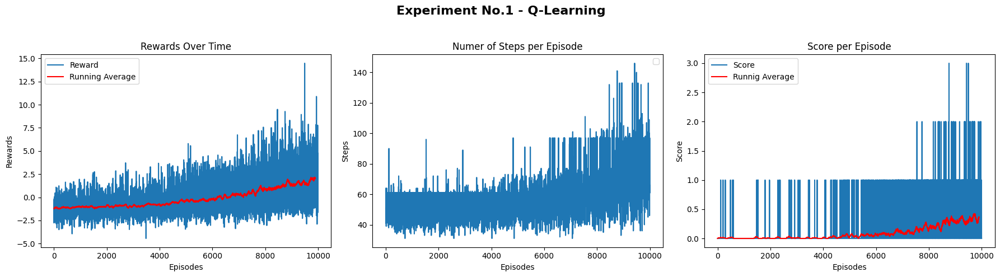

Training Progress: 100%|██████████| 10000/10000 [13:46<00:00, 12.10episode/s]


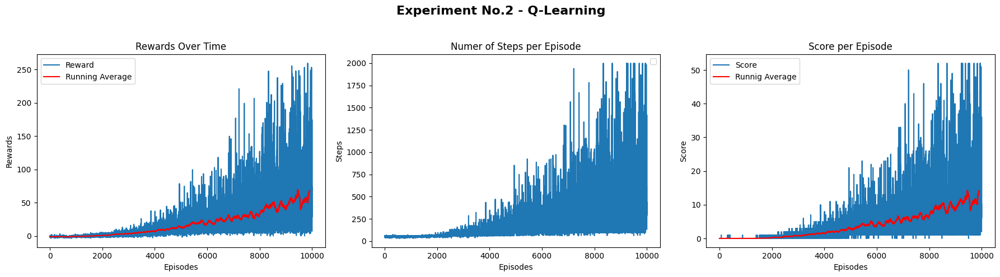

Training Progress: 100%|██████████| 10000/10000 [35:59<00:00,  4.63episode/s]


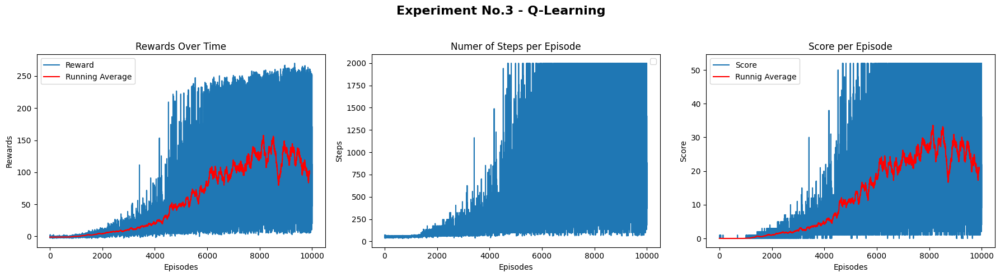

In [ ]:
agents = [agent_1_QLA, agent_2_QLA, agent_3_QLA]
num_episods = 10000
i = 1
for agent in agents:
  rewards_list, steps_list, score_list = agent.train(env, num_episods, video_display=False)
  train_analysis(rewards_list, steps_list, score_list, i, 'Q-Learning')
  i += 1

The third agent performed the best.

In [ ]:
# 3rd agent training including video - not entire trainig process due to high running time when recoreding the vidoes
env = Game(custom_obs=True, preprocess=preprocess, reward_shaping=reward_shaping, custome_observation_map=custome_observation_map)

gamma = 0.9
learning_rate = 0.7
epsilon_decay = 0.001
epsilon_start = 1.0
epsilon_min = 0.01
QLA = QLearningAgent(env.action_space, env.observation_space, gamma, learning_rate, epsilon_decay, epsilon_start, epsilon_min, env)

num_episods = 5000
rewards_list, steps_list, score_list = QLA.train(env, num_episods, video_display=True)

Training Progress: 100%|██████████| 5000/5000 [1:22:10<00:00,  1.01episode/s]


In [ ]:
embed_mp4('/content/QLearn_training_videos/combined_training_video.mp4')

Training Progress: 100%|██████████| 30000/30000 [3:30:49<00:00,  2.37episode/s]


Policy saved


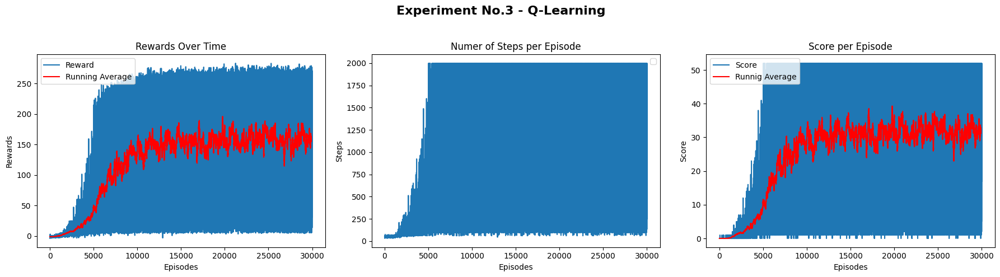

In [ ]:
# 3rd agent training for more epsiodes
env = Game(custom_obs=True, preprocess=preprocess, reward_shaping=reward_shaping, custome_observation_map=custome_observation_map)

gamma = 0.9
learning_rate = 0.7
epsilon_decay = 0.001
epsilon_start = 1.0
epsilon_min = 0.01
QLA = QLearningAgent(env.action_space, env.observation_space, gamma, learning_rate, epsilon_decay, epsilon_start, epsilon_min, env)

num_episods = 30000
rewards_list, steps_list, score_list = QLA.train(env, num_episods, video_display=False)
QLA.save_policy("qtable_QLearning_agent3.pkl")
train_analysis(rewards_list, steps_list, score_list, 3, 'Q-Learning')

In [ ]:
from google.colab import files
files.download('/content/qtable_QLearning_agent3.pkl')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Training Progress: 100%|██████████| 40000/40000 [2:42:53<00:00,  4.09episode/s]


Policy saved


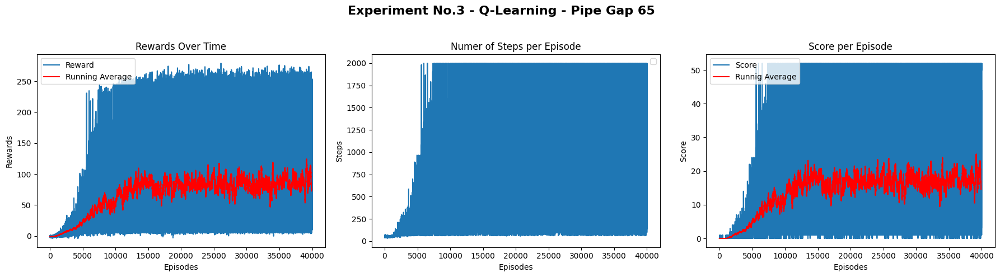

In [ ]:
# 3rd agent training for more epsiodes - pipe_gap = 65
env = Game(custom_obs=True, preprocess=preprocess, reward_shaping=reward_shaping, custome_observation_map=custome_observation_map, pipe_gap=65)

gamma = 0.9
learning_rate = 0.7
epsilon_decay = 0.001
epsilon_start = 1.0
epsilon_min = 0.01
QLA = QLearningAgent(env.action_space, env.observation_space, gamma, learning_rate, epsilon_decay, epsilon_start, epsilon_min, env)

num_episods = 40000
rewards_list, steps_list, score_list = QLA.train(env, num_episods, video_display=False)
QLA.save_policy("qtable_QLearning_agent3_gap65.pkl")
train_analysis(rewards_list, steps_list, score_list, 3, 'Q-Learning - Pipe Gap 65')

In [ ]:
from google.colab import files
files.download('/content/qtable_QLearning_agent3_gap65.pkl')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

SARSA:

In [ ]:
env = Game(custom_obs=True, preprocess=preprocess, reward_shaping=reward_shaping, custome_observation_map=custome_observation_map)

# 1st Experiment
gamma = 0.5
learning_rate = 0.5
epsilon_decay = 0.995
epsilon_start = 1.0
epsilon_min = 0.01
agent_1_SA = SARSAAgent(env.action_space, env.observation_space, gamma, learning_rate, epsilon_decay, epsilon_start, epsilon_min, env)

# 2nd Experiment
gamma = 0.8
learning_rate = 0.4
epsilon_decay = 0.999
epsilon_start = 1.0
epsilon_min = 0.01
agent_2_SA = SARSAAgent(env.action_space, env.observation_space, gamma, learning_rate, epsilon_decay, epsilon_start, epsilon_min, env)

# 3rd Experiment
gamma = 0.95
learning_rate = 0.3
epsilon_decay = 0.9995
epsilon_start = 1.0
epsilon_min = 0.01
agent_3_SA = SARSAAgent(env.action_space, env.observation_space, gamma, learning_rate, epsilon_decay, epsilon_start, epsilon_min, env)

Training Progress: 100%|██████████| 10000/10000 [31:14<00:00,  5.33episode/s]


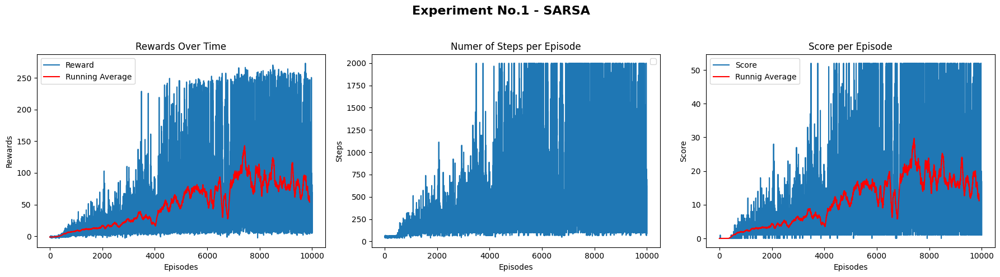

Training Progress: 100%|██████████| 10000/10000 [29:31<00:00,  5.65episode/s]


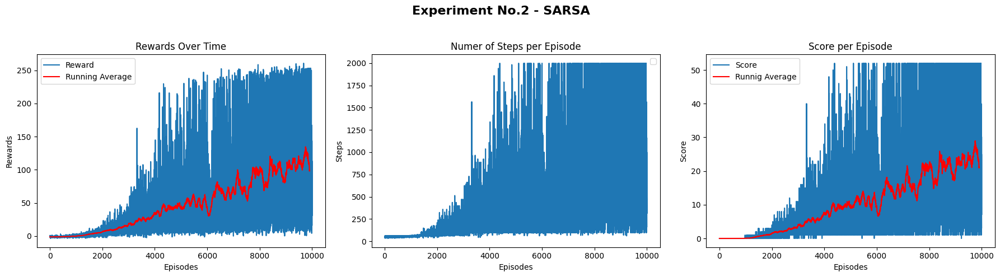

Training Progress: 100%|██████████| 10000/10000 [22:13<00:00,  7.50episode/s]


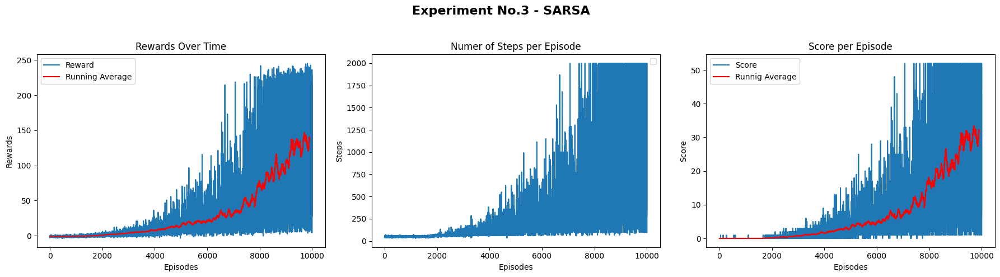

In [ ]:
agents = [agent_1_SA, agent_2_SA, agent_3_SA]
num_episods = 10000
i = 1
for agent in agents:
  rewards_list, steps_list, score_list = agent.train(env, num_episods, video_display=False)
  train_analysis(rewards_list, steps_list, score_list, i, 'SARSA')
  i += 1

In [ ]:
# 3rd agent training including video - not entire trainig process due to high running time when recoreding the vidoes
env = Game(custom_obs=True, preprocess=preprocess, reward_shaping=reward_shaping, custome_observation_map=custome_observation_map)

gamma = 0.95
learning_rate = 0.3
epsilon_decay = 0.9995
epsilon_start = 1.0
epsilon_min = 0.01
SA = SARSAAgent(env.action_space, env.observation_space, gamma, learning_rate, epsilon_decay, epsilon_start, epsilon_min, env)

num_episods = 8000
rewards_list, steps_list, score_list = SA.train(env, num_episods, video_display=True)

Training Progress: 100%|██████████| 8000/8000 [1:01:28<00:00,  2.17episode/s]


In [ ]:
embed_mp4('/content/SARSA_training_videos/combined_training_video.mp4')

Training Progress: 100%|██████████| 30000/30000 [3:20:30<00:00,  2.49episode/s]


Policy saved


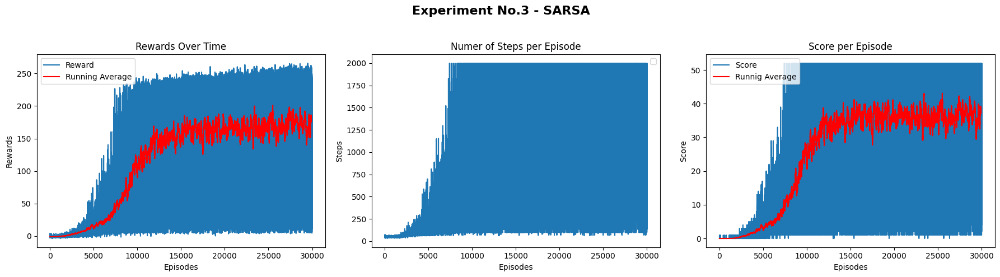

In [ ]:
# 3rd agent training for more epsiodes
env = Game(custom_obs=True, preprocess=preprocess, reward_shaping=reward_shaping, custome_observation_map=custome_observation_map)

gamma = 0.95
learning_rate = 0.3
epsilon_decay = 0.9995
epsilon_start = 1.0
epsilon_min = 0.01
SA = SARSAAgent(env.action_space, env.observation_space, gamma, learning_rate, epsilon_decay, epsilon_start, epsilon_min, env)

num_episods = 30000
rewards_list, steps_list, score_list = SA.train(env, num_episods, video_display=False)
SA.save_policy("qtable_SARSA_agent3.pkl")
train_analysis(rewards_list, steps_list, score_list, 3, 'SARSA')

In [ ]:
from google.colab import files
files.download('/content/qtable_SARSA_agent3.pkl')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Training Progress: 100%|██████████| 40000/40000 [2:59:01<00:00,  3.72episode/s]


Policy saved


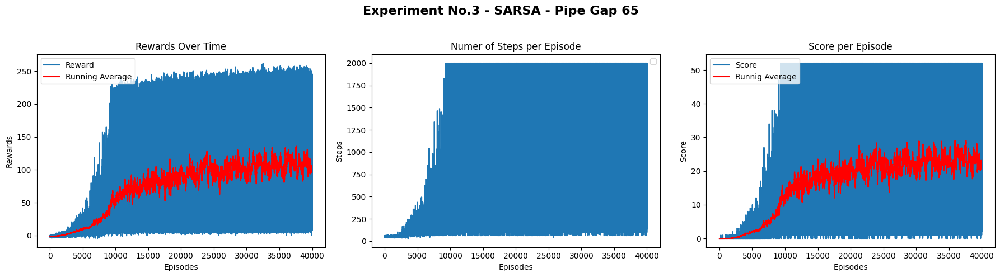

In [ ]:
# 3rd agent training for more epsiodes - pipe_gap = 65
env = Game(custom_obs=True, preprocess=preprocess, reward_shaping=reward_shaping, custome_observation_map=custome_observation_map, pipe_gap=65)

gamma = 0.95
learning_rate = 0.3
epsilon_decay = 0.9995
epsilon_start = 1.0
epsilon_min = 0.01
SA = SARSAAgent(env.action_space, env.observation_space, gamma, learning_rate, epsilon_decay, epsilon_start, epsilon_min, env)

num_episods = 40000
rewards_list, steps_list, score_list = SA.train(env, num_episods, video_display=False)
SA.save_policy("qtable_SARSA_agent3_gap65.pkl")
train_analysis(rewards_list, steps_list, score_list, 3, 'SARSA - Pipe Gap 65')

In [ ]:
from google.colab import files
files.download('/content/qtable_SARSA_agent3_gap65.pkl')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

____________________________

## Validation

#### Validation Section

In this section, you will validate your agent’s performance using the best-performing configuration identified in the experimentation phase. This validation step should be less exhaustive than the experimentation section but should provide sufficient evidence of your agent's consistency and stability.

1. **Run Validation Trials**:
   - Using the chosen configuration, run the agent in the environment for **multiple trials** (e.g., 5-10 episodes) to test its reliability.
   - Observe the agent's performance across these trials to confirm whether it consistently achieves or exceeds the target score of 10.

2. **Provide Key Summaries**:
   - **Performance Metrics**: Summarize the agent’s performance with key metrics such as average score, highest score, and variance across trials.
   - **Graphs** (Optional): Include basic graphs showing score progression or any other relevant metric, if they provide additional insight into the agent's stability.

3. **Brief Analysis**:
   - Reflect on the agent's performance in validation. Note any patterns or inconsistencies and provide a short explanation of how these results align (or differ) from your expectations based on the experimentation phase.

*Note*: This validation section should confirm and strengthen the results of your experimentation, focusing on reliability and consistency rather than extensive analysis.

*Note*: Store the agent's policy to files since you asked to provide aditional notbook that loads the agent policy


In [ ]:
def validation_plots(rewards_list, steps_list, score_list):
  plt.figure(figsize=(12, 8))
  plt.subplot(2, 2, 1)
  plt.plot(score_list, marker='o')
  plt.axhline(y=10, color='r', linestyle='--', label='Target Score')
  plt.title('Validation Scores')
  plt.xlabel('Trial')
  plt.ylabel('Score')
  plt.legend()


  plt.subplot(2, 2, 2)
  plt.plot(steps_list, marker='o')
  plt.title('Episode Lengths')
  plt.xlabel('Trial')
  plt.ylabel('Steps')

  plt.subplot(2, 2, 3)
  plt.plot(rewards_list, marker='o')
  plt.title('Total Rewards')
  plt.xlabel('Trial')
  plt.ylabel('Reward')

  plt.subplot(2, 2, 4)
  plt.boxplot(score_list, labels=['Scores'])
  plt.axhline(y=10, color='r', linestyle='--', label='Target Score')
  plt.title('Score Distribution')
  plt.ylabel('Score')

  plt.tight_layout()
  plt.show()


**Validation for agent trained using Q-Learning and pipe gap 80:**

In [ ]:
# Validation for pipe_gap = 80
env = Game(custom_obs=True, preprocess=preprocess, reward_shaping=reward_shaping, custome_observation_map=custome_observation_map, pipe_gap=80)

gamma = 0.9
learning_rate = 0.7
epsilon_decay = 0.001
epsilon_start = 1.0
epsilon_min = 0.01
QLA = QLearningAgent(env.action_space, env.observation_space, gamma, learning_rate, epsilon_decay, epsilon_start, epsilon_min, env)

New policy was loaded
Number of steps: 1002
Game score: 25
Number of steps: 7104
Game score: 187
Number of steps: 2697
Game score: 70
Number of steps: 13283
Game score: 351
Number of steps: 3072
Game score: 80
Number of steps: 10006
Game score: 264
Number of steps: 4315
Game score: 113
Number of steps: 4315
Game score: 113
Number of steps: 1490
Game score: 38
Number of steps: 5974
Game score: 157

Validation Summary:
Success Rate: 100.0%
Mean Score: 139.80 ± 97.97
Best Score: 351
Mean Episode Length: 5325.8
Mean Total Reward: 692.52



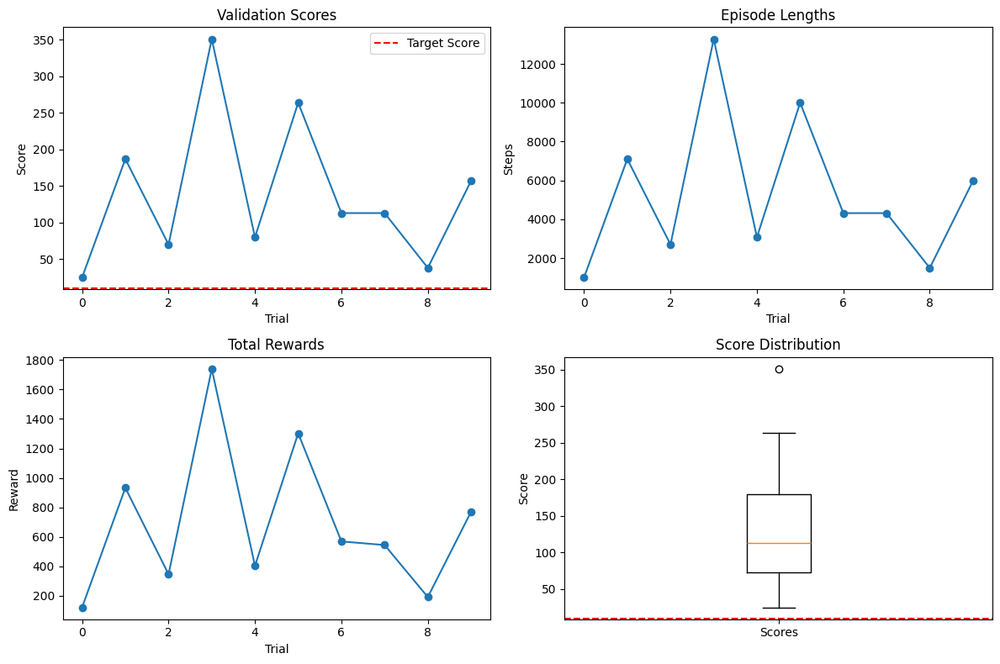

In [ ]:
file_name = "/content/qtable_QLearning_agent3_trained_gap80.pkl"

QLA.load_policy(file_name)

num_tests = 10
rewards_list = []
steps_list = []
score_list = []

for i in range(num_tests):
  rewards, steps, score = QLA.run_policy(env)
  rewards_list.append(rewards)
  steps_list.append(steps)
  score_list.append(score)

SR = sum(x > 9 for x in score_list)

# Validation evaluation
print("\nValidation Summary:")
print("=" * 50)
print(f"Success Rate: {(SR / num_tests * 100):.1f}%")
print(f"Mean Score: {np.mean(score_list):.2f} ± {np.std(score_list):.2f}")
print(f"Best Score: {max(score_list)}")
print(f"Mean Episode Length: {np.mean(steps_list):.1f}")
print(f"Mean Total Reward: {np.mean(rewards_list):.2f}")
print("")
validation_plots(rewards_list, steps_list, score_list) # Plot validation results
print("")
embed_mp4("/content/vid.mp4") # Video of the last test

In [ ]:
# Validation for pipe_gap = 65
env = Game(custom_obs=True, preprocess=preprocess, reward_shaping=reward_shaping, custome_observation_map=custome_observation_map, pipe_gap=65)

gamma = 0.9
learning_rate = 0.7
epsilon_decay = 0.001
epsilon_start = 1.0
epsilon_min = 0.01
QLA = QLearningAgent(env.action_space, env.observation_space, gamma, learning_rate, epsilon_decay, epsilon_start, epsilon_min, env)

New policy was loaded
Number of steps: 71
Game score: 1
Number of steps: 71
Game score: 1
Number of steps: 99
Game score: 1
Number of steps: 144
Game score: 3
Number of steps: 72
Game score: 1
Number of steps: 143
Game score: 3
Number of steps: 144
Game score: 3
Number of steps: 107
Game score: 2
Number of steps: 110
Game score: 2
Number of steps: 98
Game score: 1

Validation Summary:
Success Rate: 0.0%
Mean Score: 1.80 ± 0.87
Best Score: 3
Mean Episode Length: 105.9
Mean Total Reward: 11.54



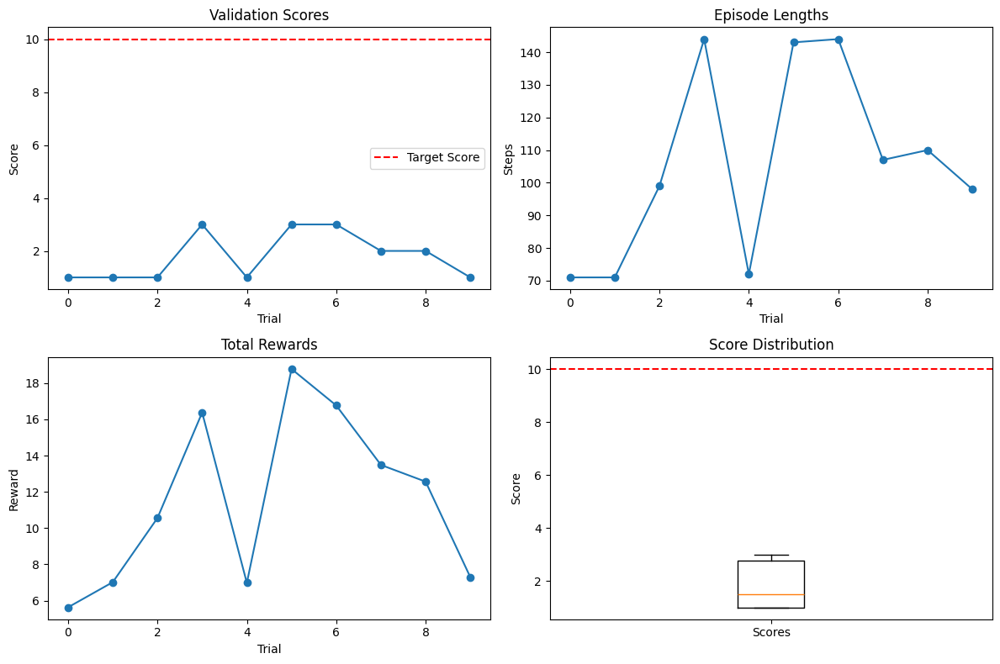

In [ ]:
file_name = "/content/qtable_QLearning_agent3_trained_gap80.pkl"

QLA.load_policy(file_name)

num_tests = 10
rewards_list = []
steps_list = []
score_list = []

for i in range(num_tests):
  rewards, steps, score = QLA.run_policy(env)
  rewards_list.append(rewards)
  steps_list.append(steps)
  score_list.append(score)

SR = sum(x > 9 for x in score_list)

# Validation evaluation
print("\nValidation Summary:")
print("=" * 50)
print(f"Success Rate: {(SR / num_tests * 100):.1f}%")
print(f"Mean Score: {np.mean(score_list):.2f} ± {np.std(score_list):.2f}")
print(f"Best Score: {max(score_list)}")
print(f"Mean Episode Length: {np.mean(steps_list):.1f}")
print(f"Mean Total Reward: {np.mean(rewards_list):.2f}")
print("")
validation_plots(rewards_list, steps_list, score_list) # Plot validation results
print("")
embed_mp4("/content/vid.mp4") # Video of the last test

**Validation for agent trained using Q-Learning and pipe gap 65:**

In [ ]:
# Validation for pipe_gap = 80
env = Game(custom_obs=True, preprocess=preprocess, reward_shaping=reward_shaping, custome_observation_map=custome_observation_map, pipe_gap=80)

gamma = 0.9
learning_rate = 0.7
epsilon_decay = 0.001
epsilon_start = 1.0
epsilon_min = 0.01
QLA = QLearningAgent(env.action_space, env.observation_space, gamma, learning_rate, epsilon_decay, epsilon_start, epsilon_min, env)

New policy was loaded
Number of steps: 1002
Game score: 25
Number of steps: 5409
Game score: 142
Number of steps: 11095
Game score: 293
Number of steps: 4767
Game score: 125
Number of steps: 925
Game score: 23
Number of steps: 627
Game score: 15
Number of steps: 1716
Game score: 44
Number of steps: 360
Game score: 8
Number of steps: 776
Game score: 19
Number of steps: 7818
Game score: 206

Validation Summary:
Success Rate: 90.0%
Mean Score: 90.00 ± 93.17
Best Score: 293
Mean Episode Length: 3449.5
Mean Total Reward: 432.83



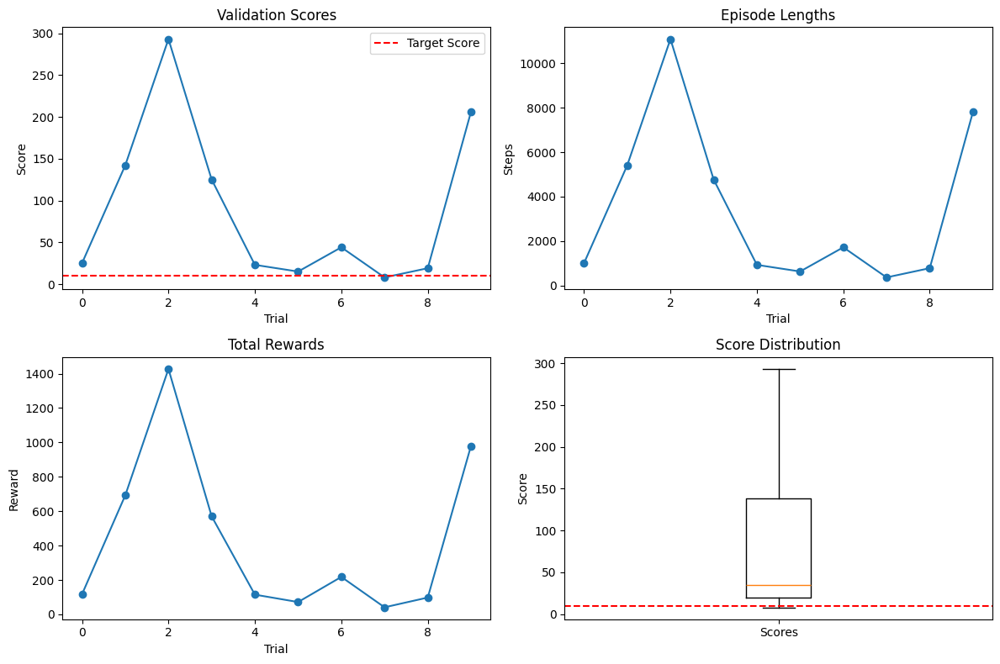

In [ ]:
file_name = "/content/qtable_QLearning_agent3_trained_gap65.pkl"

QLA.load_policy(file_name)

num_tests = 10
rewards_list = []
steps_list = []
score_list = []

for i in range(num_tests):
  rewards, steps, score = QLA.run_policy(env)
  rewards_list.append(rewards)
  steps_list.append(steps)
  score_list.append(score)

SR = sum(x > 9 for x in score_list)

# Validation evaluation
print("\nValidation Summary:")
print("=" * 50)
print(f"Success Rate: {(SR / num_tests * 100):.1f}%")
print(f"Mean Score: {np.mean(score_list):.2f} ± {np.std(score_list):.2f}")
print(f"Best Score: {max(score_list)}")
print(f"Mean Episode Length: {np.mean(steps_list):.1f}")
print(f"Mean Total Reward: {np.mean(rewards_list):.2f}")
print("")
validation_plots(rewards_list, steps_list, score_list) # Plot validation results
print("")
embed_mp4("/content/vid.mp4") # Video of the last test

In [ ]:
# Validation for pipe_gap = 65
env = Game(custom_obs=True, preprocess=preprocess, reward_shaping=reward_shaping, custome_observation_map=custome_observation_map, pipe_gap=65)

gamma = 0.9
learning_rate = 0.7
epsilon_decay = 0.001
epsilon_start = 1.0
epsilon_min = 0.01
QLA = QLearningAgent(env.action_space, env.observation_space, gamma, learning_rate, epsilon_decay, epsilon_start, epsilon_min, env)

New policy was loaded
Number of steps: 1038
Game score: 26
Number of steps: 7479
Game score: 197
Number of steps: 247
Game score: 5
Number of steps: 1531
Game score: 39
Number of steps: 776
Game score: 19
Number of steps: 699
Game score: 17
Number of steps: 812
Game score: 20
Number of steps: 324
Game score: 7
Number of steps: 247
Game score: 5
Number of steps: 1038
Game score: 26

Validation Summary:
Success Rate: 70.0%
Mean Score: 36.10 ± 54.59
Best Score: 197
Mean Episode Length: 1419.1
Mean Total Reward: 177.63



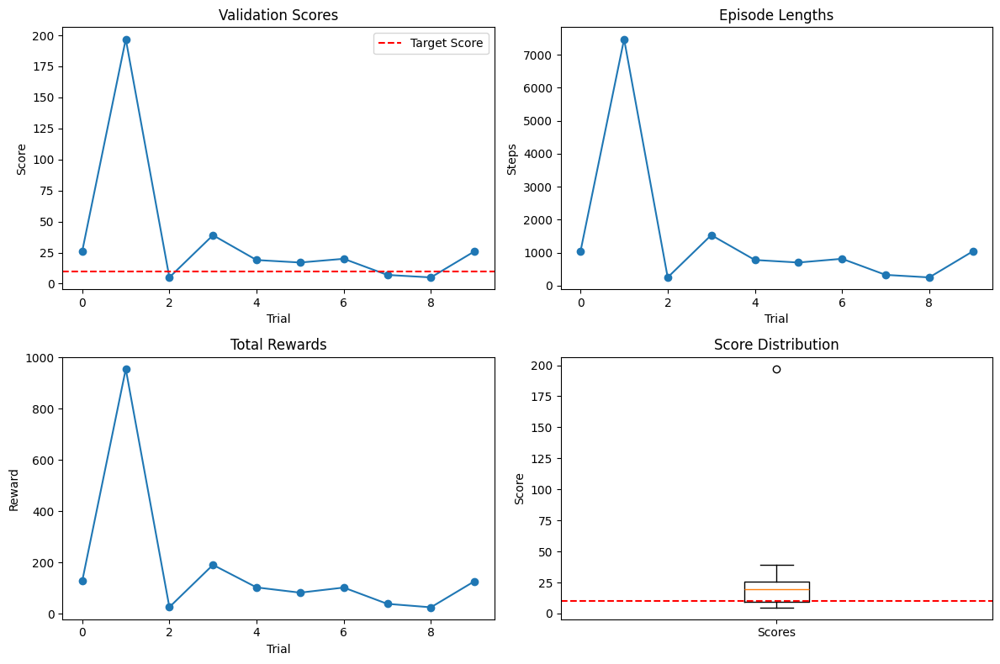

In [ ]:
file_name = "/content/qtable_QLearning_agent3_trained_gap65.pkl"

QLA.load_policy(file_name)

num_tests = 10
rewards_list = []
steps_list = []
score_list = []



for i in range(num_tests):
  rewards, steps, score = QLA.run_policy(env)
  rewards_list.append(rewards)
  steps_list.append(steps)
  score_list.append(score)

SR = sum(x > 9 for x in score_list)

# Validation evaluation
print("\nValidation Summary:")
print("=" * 50)
print(f"Success Rate: {(SR / num_tests * 100):.1f}%")
print(f"Mean Score: {np.mean(score_list):.2f} ± {np.std(score_list):.2f}")
print(f"Best Score: {max(score_list)}")
print(f"Mean Episode Length: {np.mean(steps_list):.1f}")
print(f"Mean Total Reward: {np.mean(rewards_list):.2f}")
print("")
validation_plots(rewards_list, steps_list, score_list) # Plot validation results
print("")
embed_mp4("/content/vid.mp4") # Video of the last test

**Validation for agent trained using SARSA and pipe gap 80:**

In [ ]:
# Validation for pipe_gap = 80
env = Game(custom_obs=True, preprocess=preprocess, reward_shaping=reward_shaping, custome_observation_map=custome_observation_map, pipe_gap=80)

gamma = 0.95
learning_rate = 0.3
epsilon_decay = 0.9995
epsilon_start = 1.0
epsilon_min = 0.01
SA = SARSAAgent(env.action_space, env.observation_space, gamma, learning_rate, epsilon_decay, epsilon_start, epsilon_min, env)

New policy was loaded
Number of steps: 1002
Game score: 25
Number of steps: 4618
Game score: 121
Number of steps: 5070
Game score: 133
Number of steps: 473
Game score: 11
Number of steps: 2358
Game score: 61
Number of steps: 10833
Game score: 286
Number of steps: 2245
Game score: 58
Number of steps: 6349
Game score: 167
Number of steps: 2019
Game score: 52
Number of steps: 889
Game score: 22

Validation Summary:
Success Rate: 100.0%
Mean Score: 93.60 ± 80.89
Best Score: 286
Mean Episode Length: 3585.6
Mean Total Reward: 439.91



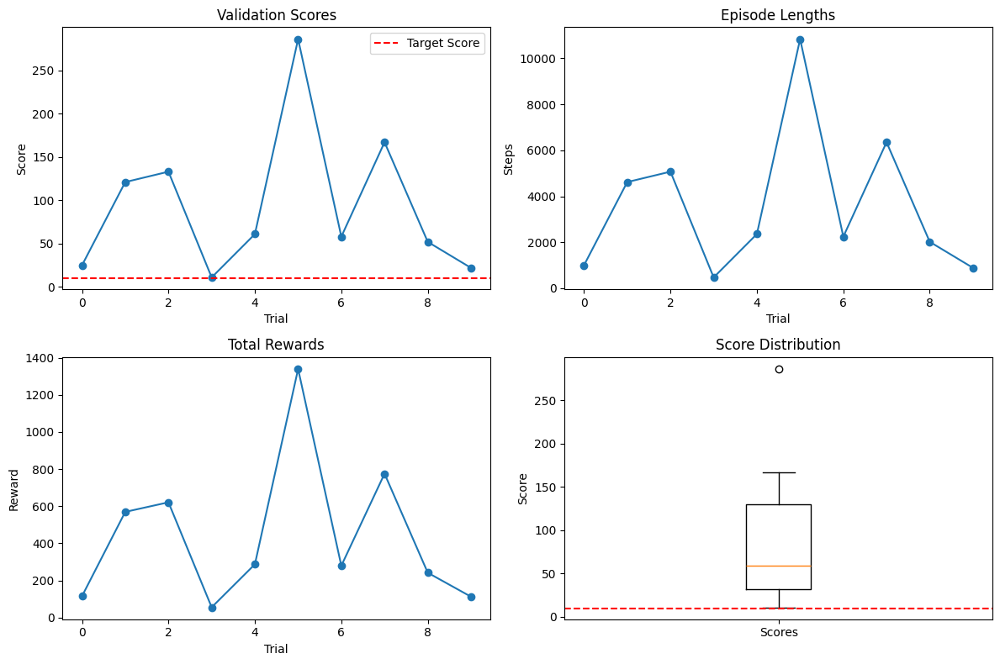

In [ ]:
file_name = "/content/qtable_SARSA_agent3_trained_gap80.pkl"

SA.load_policy(file_name)

num_tests = 10
rewards_list = []
steps_list = []
score_list = []

for i in range(num_tests):
  rewards, steps, score = SA.run_policy(env)
  rewards_list.append(rewards)
  steps_list.append(steps)
  score_list.append(score)

SR = sum(x > 9 for x in score_list)

# Validation evaluation
print("\nValidation Summary:")
print("=" * 50)
print(f"Success Rate: {(SR / num_tests * 100):.1f}%")
print(f"Mean Score: {np.mean(score_list):.2f} ± {np.std(score_list):.2f}")
print(f"Best Score: {max(score_list)}")
print(f"Mean Episode Length: {np.mean(steps_list):.1f}")
print(f"Mean Total Reward: {np.mean(rewards_list):.2f}")
print("")
validation_plots(rewards_list, steps_list, score_list) # Plot validation results
print("")
embed_mp4("/content/vid.mp4") # Video of the last test

In [ ]:
# Validation for pipe_gap = 65
env = Game(custom_obs=True, preprocess=preprocess, reward_shaping=reward_shaping, custome_observation_map=custome_observation_map, pipe_gap=65)

gamma = 0.95
learning_rate = 0.3
epsilon_decay = 0.9995
epsilon_start = 1.0
epsilon_min = 0.01
SA = SARSAAgent(env.action_space, env.observation_space, gamma, learning_rate, epsilon_decay, epsilon_start, epsilon_min, env)

New policy was loaded
Number of steps: 699
Game score: 17
Number of steps: 211
Game score: 4
Number of steps: 601
Game score: 15
Number of steps: 663
Game score: 16
Number of steps: 416
Game score: 10
Number of steps: 868
Game score: 22
Number of steps: 205
Game score: 4
Number of steps: 529
Game score: 13
Number of steps: 302
Game score: 7
Number of steps: 1806
Game score: 47

Validation Summary:
Success Rate: 70.0%
Mean Score: 15.50 ± 11.88
Best Score: 47
Mean Episode Length: 630.0
Mean Total Reward: 74.66



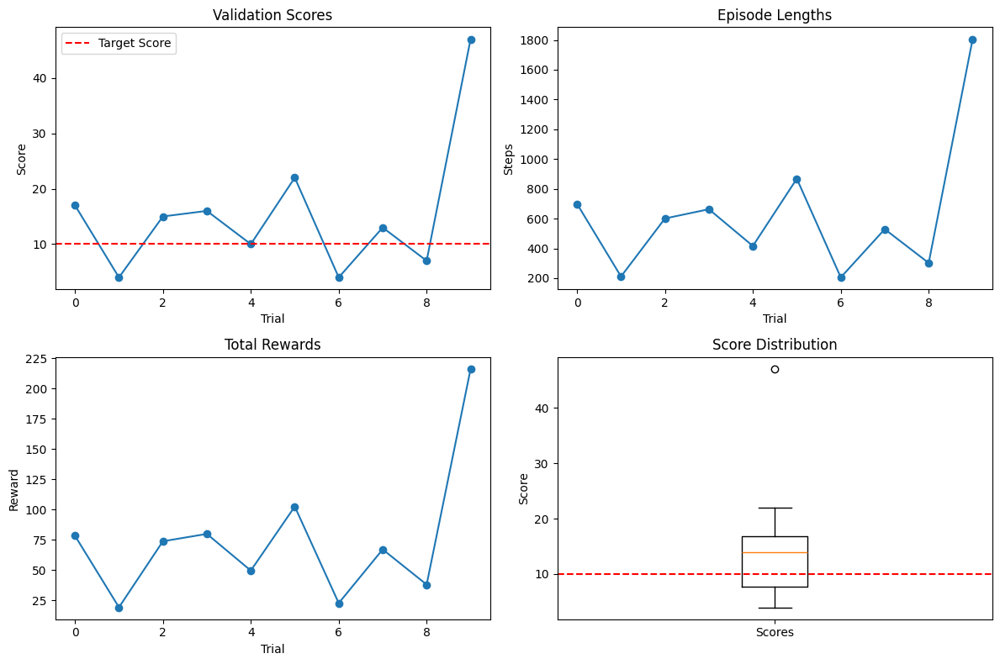

In [ ]:
file_name = "/content/qtable_SARSA_agent3_trained_gap80.pkl"

SA.load_policy(file_name)

num_tests = 10
rewards_list = []
steps_list = []
score_list = []

for i in range(num_tests):
  rewards, steps, score = SA.run_policy(env)
  rewards_list.append(rewards)
  steps_list.append(steps)
  score_list.append(score)

SR = sum(x > 9 for x in score_list)

# Validation evaluation
print("\nValidation Summary:")
print("=" * 50)
print(f"Success Rate: {(SR / num_tests * 100):.1f}%")
print(f"Mean Score: {np.mean(score_list):.2f} ± {np.std(score_list):.2f}")
print(f"Best Score: {max(score_list)}")
print(f"Mean Episode Length: {np.mean(steps_list):.1f}")
print(f"Mean Total Reward: {np.mean(rewards_list):.2f}")
print("")
validation_plots(rewards_list, steps_list, score_list) # Plot validation results
print("")
embed_mp4("/content/vid.mp4") # Video of the last test

**Validation for agent trained using SARSA and pipe gap 65:**

In [ ]:
# Validation for pipe_gap = 80
env = Game(custom_obs=True, preprocess=preprocess, reward_shaping=reward_shaping, custome_observation_map=custome_observation_map, pipe_gap=80)

gamma = 0.95
learning_rate = 0.3
epsilon_decay = 0.9995
epsilon_start = 1.0
epsilon_min = 0.01
SA = SARSAAgent(env.action_space, env.observation_space, gamma, learning_rate, epsilon_decay, epsilon_start, epsilon_min, env)

New policy was loaded
Number of steps: 4392
Game score: 115
Number of steps: 1264
Game score: 32
Number of steps: 3714
Game score: 97
Number of steps: 1906
Game score: 49
Number of steps: 1942
Game score: 50
Number of steps: 9739
Game score: 257
Number of steps: 5070
Game score: 133
Number of steps: 1942
Game score: 50
Number of steps: 1490
Game score: 38
Number of steps: 1115
Game score: 28

Validation Summary:
Success Rate: 100.0%
Mean Score: 84.90 ± 67.04
Best Score: 257
Mean Episode Length: 3257.4
Mean Total Reward: 389.41



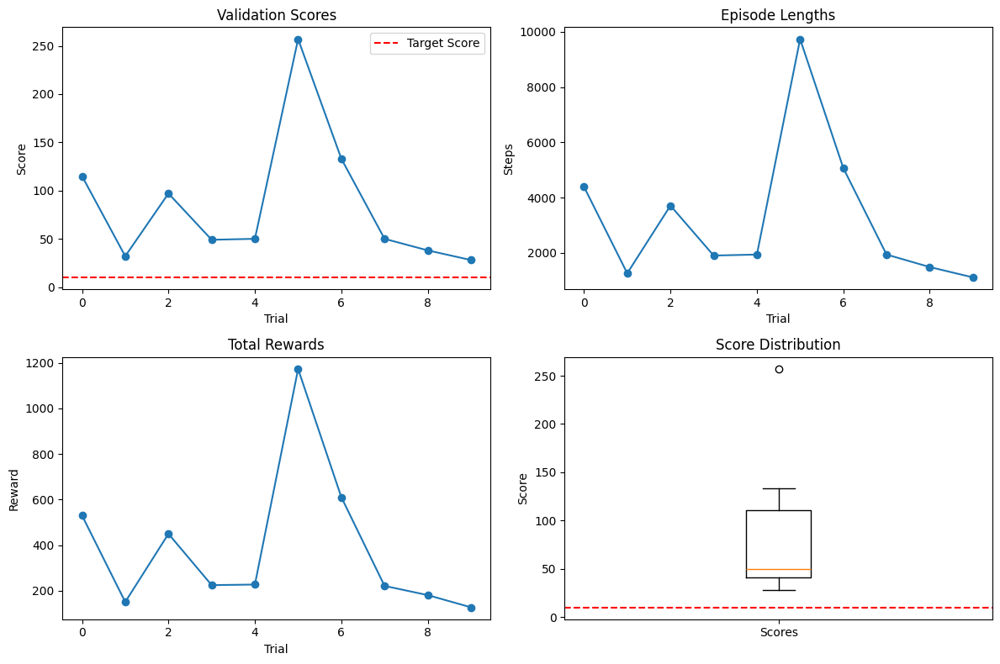

In [ ]:
file_name = "/content/qtable_SARSA_agent3_trained_gap65.pkl"

SA.load_policy(file_name)

num_tests = 10
rewards_list = []
steps_list = []
score_list = []

for i in range(num_tests):
  rewards, steps, score = SA.run_policy(env)
  rewards_list.append(rewards)
  steps_list.append(steps)
  score_list.append(score)

SR = sum(x > 9 for x in score_list)

# Validation evaluation
print("\nValidation Summary:")
print("=" * 50)
print(f"Success Rate: {(SR / num_tests * 100):.1f}%")
print(f"Mean Score: {np.mean(score_list):.2f} ± {np.std(score_list):.2f}")
print(f"Best Score: {max(score_list)}")
print(f"Mean Episode Length: {np.mean(steps_list):.1f}")
print(f"Mean Total Reward: {np.mean(rewards_list):.2f}")
print("")
validation_plots(rewards_list, steps_list, score_list) # Plot validation results
print("")
embed_mp4("/content/vid.mp4") # Video of the last test

In [ ]:
# Validation for pipe_gap = 65
env = Game(custom_obs=True, preprocess=preprocess, reward_shaping=reward_shaping, custome_observation_map=custome_observation_map, pipe_gap=65)

gamma = 0.95
learning_rate = 0.3
epsilon_decay = 0.9995
epsilon_start = 1.0
epsilon_min = 0.01
SA = SARSAAgent(env.action_space, env.observation_space, gamma, learning_rate, epsilon_decay, epsilon_start, epsilon_min, env)

New policy was loaded
Number of steps: 1038
Game score: 26
Number of steps: 1906
Game score: 49
Number of steps: 3411
Game score: 89
Number of steps: 3298
Game score: 86
Number of steps: 550
Game score: 13
Number of steps: 3411
Game score: 89
Number of steps: 4541
Game score: 119
Number of steps: 3298
Game score: 86
Number of steps: 2245
Game score: 58
Number of steps: 1567
Game score: 40

Validation Summary:
Success Rate: 100.0%
Mean Score: 65.50 ± 31.78
Best Score: 119
Mean Episode Length: 2526.5
Mean Total Reward: 301.94



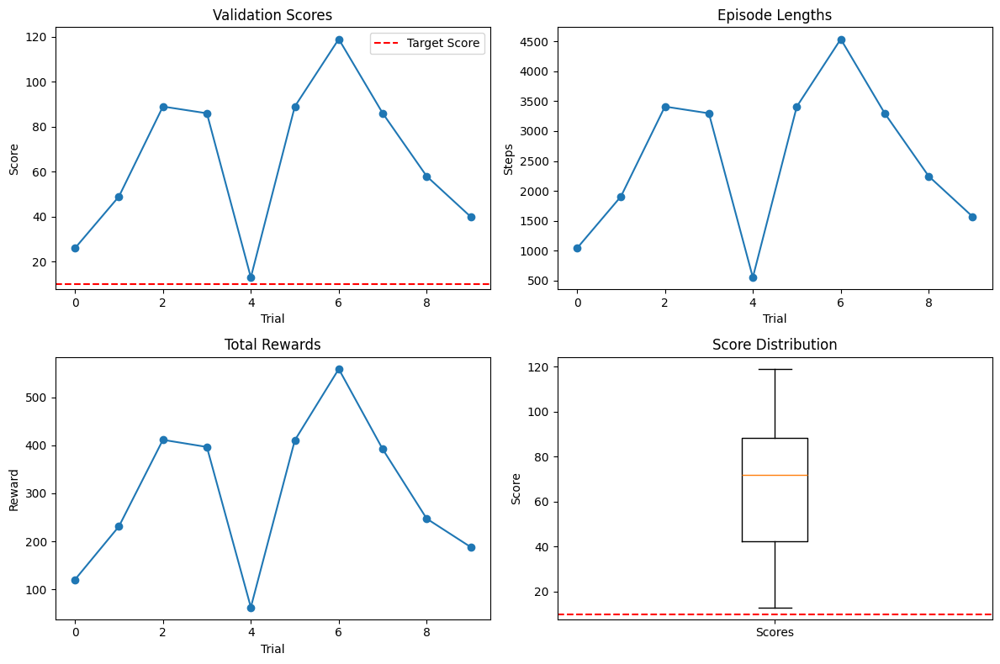

In [ ]:
file_name = "/content/qtable_SARSA_agent3_trained_gap65.pkl"

SA.load_policy(file_name)

num_tests = 10
rewards_list = []
steps_list = []
score_list = []

for i in range(num_tests):
  rewards, steps, score = SA.run_policy(env)
  rewards_list.append(rewards)
  steps_list.append(steps)
  score_list.append(score)

SR = sum(x > 9 for x in score_list)

# Validation evaluation
print("\nValidation Summary:")
print("=" * 50)
print(f"Success Rate: {(SR / num_tests * 100):.1f}%")
print(f"Mean Score: {np.mean(score_list):.2f} ± {np.std(score_list):.2f}")
print(f"Best Score: {max(score_list)}")
print(f"Mean Episode Length: {np.mean(steps_list):.1f}")
print(f"Mean Total Reward: {np.mean(rewards_list):.2f}")
print("")
validation_plots(rewards_list, steps_list, score_list) # Plot validation results
print("")
embed_mp4("/content/vid.mp4") # Video of the last test